### EXERCISE 1 : Generate 1-D Gaussian Distribution from Uniform Noise

In this exercise, we are going to generate 1-D Gaussian distribution from a n-D uniform distribution. This is a toy exercise in order to understand the ability of GANs (generators) to generate arbitrary distributions from random noise.

In [1]:
from keras.models import Sequential, Model
from keras.layers import Dense, Dropout
from keras.layers import LSTM, SimpleRNN, Input
from keras.layers import Embedding
from keras.layers import Flatten
from keras.preprocessing import sequence
from keras.layers import Conv1D
from keras.layers import MaxPooling1D
import numpy as np
import matplotlib.pyplot as plt
import scipy

np.random.seed(1)

Generate training data - Gaussian Distribution

In [2]:
def generate_data(n_samples = 10000,n_dim=1):
  return np.random.randn(n_samples, n_dim)

Let us define a function that gives you a keras model of general feedforward network based on the parameters.

In [3]:
#INPUT is of input dim,, goes through n_layers number of hidden layers and output is of output_dim
def set_model(input_dim, output_dim, hidden_dim=64,n_layers = 1,activation='tanh',
              optimizer='adam', loss = 'binary_crossentropy'):
    #### YOUR CODE HERE ####
    model = Sequential()
    model.add(Dense(hidden_dim,input_dim=input_dim,activation=activation))

    for _ in range(n_layers-1):
      model.add(Dense(hidden_dim),activation=activation)
    model.add(Dense(output_dim))

    model.compile(loss=loss, optimizer=optimizer)
    print(model.summary())
    return model


In [4]:
#INPUT (z) is of random_dim dimension
#OUTPUT should be a keras model - D(G(z)) - Discriminator score for the generator's images generated
#from synthetic data.

def get_gan_network(discriminator, random_dim, generator, optimizer = 'adam'):
    ### YOUR CODE HERE ###
    discriminator.trainable = False
    gan_input = Input(shape=(random_dim,))
    x = generator(gan_input)
    gan_output = discriminator(x)
    gan = Model(inputs = gan_input,outputs=gan_output)
    gan.compile( loss='binary_crossentropy', optimizer=optimizer)
    return gan

Let us now write the training function for a GAN

In [5]:
NOISE_DIM = 10
DATA_DIM = 1
G_LAYERS = 1
D_LAYERS = 1

In [6]:
def train_gan(epochs=1,batch_size=128):
  x_train = generate_data(n_samples=12800,n_dim=DATA_DIM)
  batch_count = x_train.shape[0]/batch_size

  generator = set_model(NOISE_DIM, DATA_DIM, n_layers=G_LAYERS, activation='tanh',loss = 'mean_squared_error')
  discriminator = set_model(DATA_DIM, 1, n_layers= D_LAYERS, activation='sigmoid')
  gan = get_gan_network(discriminator, NOISE_DIM, generator, 'adam')

  for e in range(1,epochs+1):

    # Noise is generated from a uniform distribution
    noise = np.random.rand(batch_size,NOISE_DIM)
    true_batch = x_train[np.random.choice(x_train.shape[0], batch_size, replace=False), :]

    generated_values = generator.predict(noise)
    X = np.concatenate([generated_values,true_batch])

    y_dis = np.zeros(2*batch_size)

    #One-sided label smoothing to avoid overconfidence. In GAN, if the discriminator depends on a small set of features to detect real images,
    #the generator may just produce these features only to exploit the discriminator.
    #The optimization may turn too greedy and produces no long term benefit.
    #To avoid the problem, we penalize the discriminator when the prediction for any real images go beyond 0.9 (D(real image)>0.9).
    y_dis[:batch_size] = 0.9

    discriminator.trainable = True
    ###YOUR CODE HERE####
    disc_history = discriminator.train_on_batch(X, y_dis)
    discriminator.trainable = False
    # One line : Train discriminator using train_on_batch
    discriminator.trainable = False

    # Train generator. Noise is generated from a uniform distribution
    ### YOUR CODE HERE. Couple of lines. Should call gan.train_on_batch()###
    noise = np.random.rand(batch_size,NOISE_DIM)
    y_gen = np.zeros(batch_size)
    gan.train_on_batch(noise, y_gen)



  return generator, discriminator


In [7]:
generator, discriminator = train_gan()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 64)                  │             704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 769 (3.00 KB)

 Trainable params: 769 (3.00 KB)

 Non-trainable params: 0 (0.00 B)

None


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2 (Dense)                      │ (None, 64)                  │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 193 (772.00 B)

 Trainable params: 193 (772.00 B)

 Non-trainable params: 0 (0.00 B)

None
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step  


Let us visualize what the generator has learned.

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1st order moment -  True :  0.0 , GAN : [0.]
2nd order moment -  True :  0.993800675880421 , GAN : [0.02012015]
3rd order moment -  True :  0.04224919831436267 , GAN : [-8.2796854e-05]
4th order moment -  True :  2.9013848672859766 , GAN : [0.00105844]


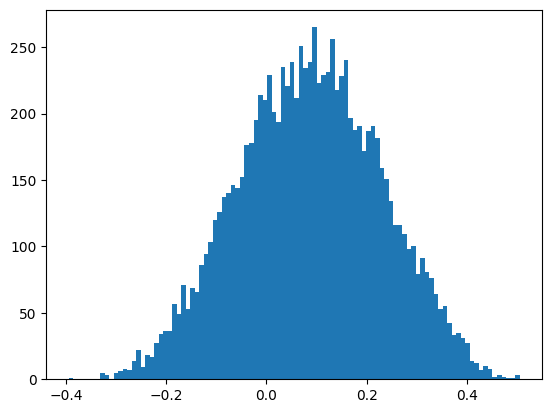

In [8]:
noise = np.random.rand(10000,NOISE_DIM)
generated_values = generator.predict(noise)
plt.hist(generated_values,bins=100)


true_gaussian = [np.random.randn() for x in range(10000)]

print('1st order moment - ', 'True : ', scipy.stats.moment(true_gaussian, 1) , ', GAN :', scipy.stats.moment(generated_values,1))
print('2nd order moment - ', 'True : ', scipy.stats.moment(true_gaussian, 2) , ', GAN :', scipy.stats.moment(generated_values,2))
print('3rd order moment - ', 'True : ', scipy.stats.moment(true_gaussian, 3) , ', GAN :', scipy.stats.moment(generated_values,3))
print('4th order moment - ', 'True : ', scipy.stats.moment(true_gaussian, 4) , ', GAN :', scipy.stats.moment(generated_values,4))
plt.show()

### EXERCISE 2 : Train real GAN - Cat's faces dataset :)

#### Generative Adversarial Networks (GANs)

GANs is a method for training generative models that was proposed in 2014 by Goodfellow et al. There are two neural networks in a GAN. One is called the generator which takes a random noise as input and outputs an image. The other is called the discriminator which is a binary classifier to classify whether an input image is a real image or a fake image generated by the generator. The goal of the generator is to generate images that can fool the discriminator into thinking the images are real.

This iterative process of generator trying to fool the discriminator and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $z \sim p(z)$ are random noise vectors,  $G(z)$ are the fake images generated by the generator $G$, $D$ is a probability of the input of the discriminator being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

In practice, for the objective of the generator, instead of minimizing the following objection:
$$\underset{G}{\text{minimize}}\; \left[\log \left(1-D(G(z))\right)\right]$$
We use a different objective for the generator: maximizing the probability of the disciminator being fooled.

$$\underset{G}{\text{maximize}}\; \left[\log \left(D(G(z))\right)\right]$$

This helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661).

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$



#### Libraries
run this cell before doing anything!

In [9]:
import cv2
import matplotlib.pyplot as plt
import random
import zipfile
import os
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import numpy as np
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from PIL import Image
import unittest
import time
from torch.autograd import Variable
from scipy.stats import shapiro


## Setup
In this section we load the data to be used in our GAN network. for this excercise we use the cat's faces dataset that we import from kaggle.
the link to the dataset is as follows:
https://www.kaggle.com/datasets/borhanitrash/cat-dataset

Dataset URL: https://www.kaggle.com/datasets/borhanitrash/cat-dataset
License(s): MIT
 96% 257M/268M [00:01<00:00, 195MB/s]
100% 268M/268M [00:01<00:00, 146MB/s]
Contents of the 'data' directory:
['cat_28242.png', 'cat_20019.png', 'cat_11019.png', 'cat_14811.png', 'cat_18110.png', 'cat_8507.png', 'cat_20169.png', 'cat_5969.png', 'cat_10427.png', 'cat_27365.png', 'cat_12113.png', 'cat_14213.png', 'cat_12431.png', 'cat_3610.png', 'cat_26637.png', 'cat_21344.png', 'cat_3038.png', 'cat_17035.png', 'cat_19520.png', 'cat_13997.png', 'cat_14494.png', 'cat_19375.png', 'cat_23464.png', 'cat_22761.png', 'cat_2566.png', 'cat_10712.png', 'cat_11118.png', 'cat_28702.png', 'cat_29221.png', 'cat_18803.png', 'cat_9186.png', 'cat_15870.png', 'cat_1590.png', 'cat_18226.png', 'cat_20290.png', 'cat_5843.png', 'cat_6632.png', 'cat_17185.png', 'cat_13763.png', 'cat_13876.png', 'cat_13756.png', 'cat_29602.png', 'cat_1155.png', 'cat_1044.png', 'cat_21251.png', 'cat_29722.png', 'cat_20947.png', 'cat_2820.png',

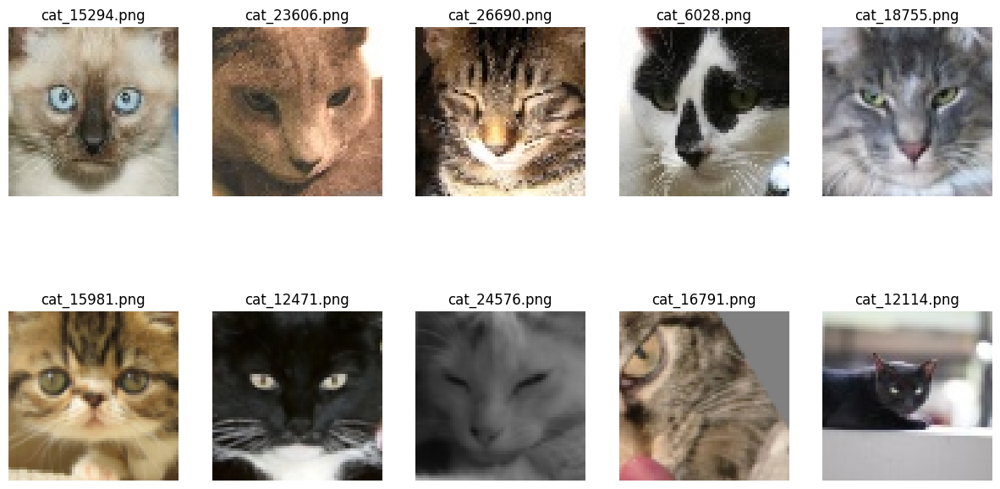

In [10]:
!pip install kaggle
!kaggle datasets download -d borhanitrash/cat-dataset --force

with zipfile.ZipFile('cat-dataset.zip', 'r') as zip_ref:
    zip_ref.extractall('./cat_dataset')

image_dir = './cat_dataset/cats/Data'

print("Contents of the 'data' directory:")
print(os.listdir(image_dir))

image_files = [f for f in os.listdir(image_dir) if f.endswith(('png', 'jpg', 'jpeg'))]

num_images = len(image_files)
print(f'Number of images: {num_images}')

if num_images > 0:
    first_image_path = os.path.join(image_dir, image_files[0])
    first_image = cv2.imread(first_image_path)

    print(f'First image shape: {first_image.shape}')

    def plot_random_images(image_files, num_images=10):
        plt.figure(figsize=(15, 8))
        random_files = random.sample(image_files, num_images)
        for i, file in enumerate(random_files):
            img_path = os.path.join(image_dir, file)
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            plt.subplot(2, 5, i + 1)
            plt.imshow(img)
            plt.axis('off')
            plt.title(file)
        plt.show()

    plot_random_images(image_files, num_images=10)
else:
    print("No images found in the specified directory.")

transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

class CustomImageDataset(torch.utils.data.Dataset):
    def __init__(self, image_files, transform=None):
        self.image_files = image_files
        self.transform = transform

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_path = os.path.join(image_dir, self.image_files[idx])
        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image


custom_data = CustomImageDataset(image_files, transform=transform)
data_loader = DataLoader(custom_data, batch_size=64, shuffle=True)


## Model design
we start by designing diffrent components of the model




## 1-Random Noise
Generate normal noise with hte mean of 0 and the variance of 1 with shape `[batch_size, noise_size]`.

In [11]:
def sample_noise(batch_size, noise_size):
    """
    Generate a PyTorch Tensor of uniform random noise.

    Input:
    - batch_size: Integer giving the batch size of noise to generate.
    - noise_size: Integer giving the dimension of noise to generate.

    Output:
    - A PyTorch Tensor of shape (batch_size, noise_size) containing normal
      random noise with a mean of 0 and variance of 1
    """
    ###############
    ###YOUR CODE HERE####
    #################
    noise = torch.randn(batch_size, noise_size)

    #################
    ###END OF YOUR CODE####
    #################

    return noise



#### unit testing the noise function
if you have implemented the sample_noise() function the right way, after running the code below, the output will say 'All tests passed!'

In [12]:
def test_sample_noise():
    batch_size = 3
    noise_size = 4
    z = sample_noise(batch_size, noise_size)
    assert z.shape == (batch_size, noise_size)
    stat, p_value = shapiro(z.flatten())
    assert p_value > 0.05, "Generated noise does not follow normal distribution"
    print('All tests passed!')

test_sample_noise()

All tests passed!


## model parameters
in this section to set your model parameters according to the values mentioned in the exercise discription.

In [13]:
torch.manual_seed(0)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

###############
###YOUR CODE HERE####
#################
noise_size = 100  # Size of the noise vector
lr = 0.0002    # Learning rate
image_size = 256  # Image dimensions (256x256)
channels = 3      # RGB channels
num_epochs = 20   # Number of epochs

#################
###END OF YOUR CODE####
#################

#### Discriminator
the discriminator class for the GAN model.

NOTE: use the exact same name as mentioned in the class discription for your layers!

In [14]:
class Discriminator(nn.Module):
    """
    The Discriminator class for a Generative Adversarial Network (GAN) model, designed to classify input images as real or fake.
    This class uses a simple fully connected network structure.

    Constructor (`__init__`):
    - Initializes all the required layers for the model.
    - Input: Flattened image tensor of shape `(batch_size, channels * 256 * 256)`.
    - Layers:
        - `fc1`: Fully connected layer with 512 output units, responsible for reducing the high-dimensional image input.
        - `do1`: Dropout layer with a dropout rate of 0.3.
        - `bn1`: Batch normalization to standardize the output of the first fully connected layer.
        - `fc2`: Final fully connected layer with a single output unit to produce the probability score.

    Forward Pass (`forward`):
    - Applies each layer sequentially:
        - First, the image tensor is flattened.
        - Then, the first fully connected layer (`fc1`) is activated by Leaky ReLU with dropout and batch normalization.
        - Finally, the second fully connected layer (`fc2`) applies a sigmoid activation to output a probability.
    - Output: A probability score between 0 and 1, indicating whether the input is real or fake.

    TO DO:
    - Complete the `forward` method by applying each layer in sequence and ensure the output is correctly formatted for binary classification.

    """

    def __init__(self):
        super(Discriminator, self).__init__()
        ###############
        ###YOUR CODE HERE####
        #################
        # First fully connected layer (fc1) with 512 output units
        self.fc = nn.Linear(256 * 256 * 3, 512)

        # Dropout layer (do1) with a dropout rate of 0.3
        self.do1 = nn.Dropout(0.3)

        # Batch normalization layer (bn1)
        self.bn1 = nn.BatchNorm1d(512)

        # Final fully connected layer (fc2) with 1 output unit for binary classification
        self.fc2 = nn.Linear(512, 1)
        #################
        ###END OF YOUR CODE####
        #################

    def forward(self, x):
        ###############
        ###YOUR CODE HERE####
        #################
        # Flatten the input image tensor
        x = x.view(x.size(0), -1)

        # First fully connected layer with LeakyReLU activation
        x = torch.nn.functional.leaky_relu(self.fc(x))  # Leaky ReLU with negative slope 0.2

        # Apply dropout and batch normalization
        x = self.bn1(self.do1(x))

        # Final fully connected layer with sigmoid activation for binary classification
        x = torch.sigmoid(self.fc2(x))
        #################
        ###END OF YOUR CODE####
        #################

        return x


#### unit testing the discriminator
if you have implemented the discriminator the right way including all the layers with the instructed DIMENSIONS and NAMES, after running the code below, the output will say 'OK'

In [15]:
class TestDiscriminatorLayers(unittest.TestCase):
    def setUp(self):
        # Initialize the Discriminator model
        self.model = Discriminator()

    def test_layer_types(self):
        # Check if layers are present with correct types
        self.assertIsInstance(self.model.fc, nn.Linear, "fc should be an instance of nn.Linear")
        self.assertIsInstance(self.model.do1, nn.Dropout, "do1 should be an instance of nn.Dropout")
        self.assertIsInstance(self.model.bn1, nn.BatchNorm1d, "bn1 should be an instance of nn.BatchNorm1d")
        self.assertIsInstance(self.model.fc2, nn.Linear, "fc2 should be an instance of nn.Linear")

    def test_layer_properties(self):
        # Check if fc layer has the correct input and output dimensions
        self.assertEqual(self.model.fc.in_features, channels * 256 * 256, "fc layer input size is incorrect")
        self.assertEqual(self.model.fc.out_features, 512, "fc layer output size is incorrect")
        # Check dropout rate
        self.assertAlmostEqual(self.model.do1.p, 0.3, places=1, msg="Dropout rate for do1 is incorrect")
        # Check batch normalization layer dimensions
        self.assertEqual(self.model.bn1.num_features, 512, "bn1 layer size is incorrect")
        # Check final output layer size
        self.assertEqual(self.model.fc2.in_features, 512, "fc2 layer input size is incorrect")
        self.assertEqual(self.model.fc2.out_features, 1, "fc2 layer output size is incorrect")

if __name__ == "__main__":
    unittest.main(argv=[''], exit=False)

..
----------------------------------------------------------------------
Ran 2 tests in 1.694s

OK


#### Generator.
the generator class for the GAN model.

NOTE: use the exact same name as mentioned in the class discription for your layers!

In [16]:
class Swish(nn.Module):
    def forward(self, x):
        return x * torch.sigmoid(x)

class Generator(nn.Module):
    """
    Generator Class for Generative Adversarial Networks (GANs)

    Constructor (`__init__`):
    - Initializes all the required layers for the model.
    - Layers:
      - `fc1`: The first fully connected layer, which transforms the noise vector into a 1024-dimensional vector.
      - `bn1`: Batch normalization for the first fully connected layer output.
      - `fc2`: The second fully connected layer, reducing dimensionality from 1024 to 512.
      - `bn2`: Batch normalization for the second fully connected layer output.
      - `fc3`: The third fully connected layer, reducing dimensionality further to 256.
      - `do1`: Dropout applied after the third layer to prevent overfitting.
      - `bn3`: Batch normalization for the third layer output.
      - `fc4`: A fully connected layer maintaining the 256-dimensional output.
      - `do2`: Dropout applied after the fourth layer.
      - `bn4`: Batch normalization for the fourth layer output.
      - `fc5`: The final fully connected layer, which transforms the output to the image size (channels * 256 * 256).
      - `activation`: Gelu activation function applied after each layer to introduce non-linearity.

    Forward Pass (`forward`):
    - Applies each layer sequentially: applies the forward pass from a generated noise vector to the generated image
    """
    def __init__(self):
        super(Generator, self).__init__()
        # First fully connected layer (fc1), transforming noise vector to 1024-dimensional vector
        self.fc1 = nn.Linear(100, 1024)

        # Batch normalization after the first layer
        self.bn1 = nn.BatchNorm1d(1024)

        # Second fully connected layer (fc2), reducing dimensionality to 512
        self.fc2 = nn.Linear(1024, 512)

        # Batch normalization after the second layer
        self.bn2 = nn.BatchNorm1d(512)

        # Third fully connected layer (fc3), reducing dimensionality further to 256
        self.fc3 = nn.Linear(512, 256)

        # Dropout after the third layer to prevent overfitting
        self.do1 = nn.Dropout(0.3)

        # Batch normalization after the third layer
        self.bn3 = nn.BatchNorm1d(256)

        # Fourth fully connected layer (fc4), maintaining the 256-dimensional output
        self.fc4 = nn.Linear(256, 256)

        # Dropout after the fourth layer
        self.do2 = nn.Dropout(0.3)

        # Batch normalization after the fourth layer
        self.bn4 = nn.BatchNorm1d(256)

        # Final fully connected layer (fc5), transforming output to match image size (channels * 256 * 256)
        self.fc5 = nn.Linear(256, 3 * 256 * 256)  # 3 channels, 256x256 image

        # GELU activation function for non-linearity
        self.activation = nn.GELU()

    def forward(self, z):
        """
        Forward Pass through the Generator.

        Args:
            z (torch.Tensor): Input noise vector with shape [batch_size, noise_size].

        Returns:
            torch.Tensor: Generated images with shape [batch_size, channels, 256, 256].
        """
        z = self.activation(self.bn1(self.fc1(z)))

        # Pass through the second fully connected layer followed by batch normalization and GELU
        z = self.activation(self.bn2(self.fc2(z)))

        # Pass through the third fully connected layer, apply dropout, batch normalization, and GELU
        z = self.activation(self.bn3(self.do1(self.fc3(z))))

        # Pass through the fourth fully connected layer with dropout, batch normalization, and GELU
        z = self.activation(self.bn4(self.do2(self.fc4(z))))

        # Pass through the final fully connected layer to generate the image (reshape to [batch_size, 3, 256, 256])
        z = self.fc5(z).view(-1, 3, 256, 256)

        return z


#### unit testing the generator
if you have implemented the generator the right way including all the layers with the instructed DIMENSIONS and NAMES, after running the code below, the output will say 'OK'

In [17]:
class TestGeneratorLayers(unittest.TestCase):
    def setUp(self):
        # Initialize the Generator model
        self.model = Generator()

    def test_layer_types(self):
        # Check if layers are present with correct types
        self.assertIsInstance(self.model.fc1, nn.Linear, "fc1 should be an instance of nn.Linear")
        self.assertIsInstance(self.model.bn1, nn.BatchNorm1d, "bn1 should be an instance of nn.BatchNorm1d")
        self.assertIsInstance(self.model.fc2, nn.Linear, "fc2 should be an instance of nn.Linear")
        self.assertIsInstance(self.model.bn2, nn.BatchNorm1d, "bn2 should be an instance of nn.BatchNorm1d")
        self.assertIsInstance(self.model.fc3, nn.Linear, "fc3 should be an instance of nn.Linear")
        self.assertIsInstance(self.model.do1, nn.Dropout, "do1 should be an instance of nn.Dropout")
        self.assertIsInstance(self.model.bn3, nn.BatchNorm1d, "bn3 should be an instance of nn.BatchNorm1d")
        self.assertIsInstance(self.model.fc4, nn.Linear, "fc4 should be an instance of nn.Linear")
        self.assertIsInstance(self.model.do2, nn.Dropout, "do2 should be an instance of nn.Dropout")
        self.assertIsInstance(self.model.bn4, nn.BatchNorm1d, "bn4 should be an instance of nn.BatchNorm1d")  # New test for bn4
        self.assertIsInstance(self.model.fc5, nn.Linear, "fc5 should be an instance of nn.Linear")

    def test_layer_properties(self):
        # Check if fc layer has the correct input and output dimensions
        self.assertEqual(self.model.fc1.in_features, noise_size, "fc1 layer input size is incorrect")
        self.assertEqual(self.model.fc1.out_features, 1024, "fc1 layer output size is incorrect")
        # Check bn1 feature size
        self.assertEqual(self.model.bn1.num_features, 1024, "bn1 layer size is incorrect")
        # Check fc2 layer dimensions
        self.assertEqual(self.model.fc2.in_features, 1024, "fc2 layer input size is incorrect")
        self.assertEqual(self.model.fc2.out_features, 512, "fc2 layer output size is incorrect")
        # Check bn2 feature size
        self.assertEqual(self.model.bn2.num_features, 512, "bn2 layer size is incorrect")
        # Check fc3 layer dimensions
        self.assertEqual(self.model.fc3.in_features, 512, "fc3 layer input size is incorrect")
        self.assertEqual(self.model.fc3.out_features, 256, "fc3 layer output size is incorrect")
        # Check dropout rate for do1
        self.assertAlmostEqual(self.model.do1.p, 0.3, places=1, msg="Dropout rate for do1 is incorrect")
        # Check bn3 feature size
        self.assertEqual(self.model.bn3.num_features, 256, "bn3 layer size is incorrect")
        # Check fc4 layer dimensions
        self.assertEqual(self.model.fc4.in_features, 256, "fc4 layer input size is incorrect")
        self.assertEqual(self.model.fc4.out_features, 256, "fc4 layer output size is incorrect")
        # Check dropout rate for do2
        self.assertAlmostEqual(self.model.do2.p, 0.3, places=1, msg="Dropout rate for do2 is incorrect")
        # Check bn4 feature size
        self.assertEqual(self.model.bn4.num_features, 256, "bn4 layer size is incorrect")  # New test for bn4
        # Check final layer output dimensions
        self.assertEqual(self.model.fc5.in_features, 256, "fc5 layer input size is incorrect")
        self.assertEqual(self.model.fc5.out_features, channels * 256 * 256, "fc5 layer output size is incorrect")

if __name__ == "__main__":
    unittest.main(argv=[''], exit=False)


....
----------------------------------------------------------------------
Ran 4 tests in 3.438s

OK


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

You will also need to compute labels corresponding to real or fake and use the logit arguments to determine their size. Make sure you cast these labels to the correct data type using the global `dtype` variable, for example:


`real_labels = torch.ones(real_images.size(0), 1, device=device)`

`fake_labels = torch.zeros(fake_images.size(0), 1, device=device)`

to obtain the loss required gor the generator and discripminator model, you will feed the real images and the fake images to variables 'G' and 'D' respectively
and calculate loss base on the output of these two modules. note that 'G' is an object of the generator class and 'D' is an object of the discriminator class which you will declare later on in the implementation!

In [18]:
def discriminator_loss(real_images, fake_images, discriminator):
    """
    Calculates the discriminator loss by comparing real and fake images.

    Args:
        real_images (Tensor): Batch of real images.
        fake_images (Tensor): Batch of fake images generated by the generator.
        discriminator (function): The discriminator function or model.

    Returns:
        Tensor: Combined loss for real and fake images for the discriminator.
    """

   # Defining real labels as 1s, matching the size of real images batch
    real_labels = torch.ones(real_images.size(0), 1, device=device)

    # Defining fake labels as 0s, matching the size of fake images batch
    fake_labels = torch.zeros(fake_images.size(0), 1, device=device)

    ###############
    ###YOUR CODE HERE####
    #################

    # Calculate the discriminator's output for real images
    real_output = discriminator(real_images)
    # Calculate the discriminator's output for fake images
    fake_output = discriminator(fake_images)

    ###############
    ## TODO:
    ## Implement the calculation of real_loss using binary cross-entropy
    ## loss for real images compared to real_labels.
    ###############
    real_loss = torch.nn.BCEWithLogitsLoss()(real_output, real_labels)

    ###############
    ## TODO:
    ## Implement the calculation of fake_loss using binary cross-entropy
    ## loss for fake images compared to fake_labels.
    ###############
    fake_loss = torch.nn.BCEWithLogitsLoss()(fake_output, fake_labels)

    #################
    ###END OF YOUR CODE####
    #################
    return real_loss + fake_loss

def generator_loss(fake_images, discriminator):
    """
    Calculates the generator loss, encouraging it to fool the discriminator.

    Args:
        fake_images (Tensor): Batch of fake images generated by the generator.
        discriminator (function): The discriminator function or model.

    Returns:
        Tensor: Loss for the generator based on the discriminator's output.
    """

    # Setting labels to 1s as the generator wants the discriminator
    # to classify fake images as real
    labels = torch.ones(fake_images.size(0), 1, device=device)

    ###############
    ###YOUR CODE HERE####
    #################

    # Calculate the discriminator's output for fake images
    fake_output = discriminator(fake_images)

    ###############
    ## TODO:
    ## Implement the calculation of fake_loss using binary cross-entropy
    ## loss for fake images compared to labels (which should be all 1s).
    ##############
    fake_loss = torch.nn.BCEWithLogitsLoss()(fake_output, labels)

    #################
    ###END OF YOUR CODE####
    #################

    return fake_loss


Testing generator and discriminator loss functions



In [19]:
def D(images):
    return torch.rand(images.size(0), 1, device=images.device)  # Dummy discriminator

class TestGANLossFunctions(unittest.TestCase):

    def setUp(self):
        """Set up the test case with dummy data."""
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.real_images = torch.randn(5, 3, 64, 64, device=self.device)  # Batch of 5 real images (3 channels, 64x64)
        self.fake_images = torch.randn(5, 3, 64, 64, device=self.device)  # Batch of 5 fake images (3 channels, 64x64)

    def test_discriminator_loss(self):
        """Test the discriminator loss function."""
        # Call the discriminator_loss function and pass the dummy discriminator (D)
        loss = discriminator_loss(self.real_images, self.fake_images, D)

        # Assert that the loss is a tensor
        self.assertIsInstance(loss, torch.Tensor)
        # Assert that the loss value is a scalar
        self.assertEqual(loss.dim(), 0)
        # Assert that the loss value is non-negative
        self.assertGreaterEqual(loss.item(), 0)

    def test_generator_loss(self):
        """Test the generator loss function."""
        # Call the generator_loss function and pass the dummy discriminator (D)
        loss = generator_loss(self.fake_images, D)

        # Assert that the loss is a tensor
        self.assertIsInstance(loss, torch.Tensor)
        # Assert that the loss value is a scalar
        self.assertEqual(loss.dim(), 0)
        # Assert that the loss value is non-negative
        self.assertGreaterEqual(loss.item(), 0)

# Running the tests in an interactive environment
unittest.TextTestRunner().run(unittest.defaultTestLoader.loadTestsFromTestCase(TestGANLossFunctions))


..
----------------------------------------------------------------------
Ran 2 tests in 0.152s

OK


<unittest.runner.TextTestResult run=2 errors=0 failures=0>

# Optimizing our loss
we will be using Adam optimizer for both our generator and discriminator

In [20]:
def get_optimizer(model):
    optimizer = optim.Adam(model.parameters(), lr = lr, betas= (0.5, 0.999))

    return optimizer

## ploting results
in this section we design a function to plot our generated images

In [21]:
def plot_generated_images(G, num_images=10):
    noise = Variable(sample_noise(num_images, noise_size).clone().detach().float()).to(device)
    with torch.no_grad():
        generated_images = G(noise)

    generated_images = (generated_images + 1) / 2
    generated_images = torch.clamp(generated_images, 0, 1)

    plt.figure(figsize=(8, 8))
    for i in range(num_images):
        plt.subplot(4, 4, i + 1)
        plt.imshow(generated_images[i].detach().cpu().numpy().transpose(1, 2, 0))
        plt.axis('off')
    plt.show()

# Training a GAN!

We provide you the main training loop. you will have to complete the required training steps, to this end, you have to utalize the generator loss and discriminator loss functions that you completed in the previous steps and wrap the entire operations of the generator passes and discriminator passes which will follow.

In [22]:
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs):
    """
    Train a Generative Adversarial Network (GAN).

    Parameters:
    - D: Discriminator model (PyTorch).
    - G: Generator model (PyTorch).
    - D_solver: Optimizer for the discriminator (torch.optim).
    - G_solver: Optimizer for the generator (torch.optim).
    - discriminator_loss: Function to compute the discriminator's loss.
    - generator_loss: Function to compute the generator's loss.
    - num_epochs: Number of training epochs.
    """
    for epoch in range(num_epochs):
        for i, real_images in enumerate(data_loader):
            # Move real images to the appropriate device
            real_images = Variable(real_images).to(device)

            # Generate fake images
            g_fake_seed = Variable(sample_noise(real_images.size(0), noise_size).float()).to(device)
            fake_images = G(g_fake_seed)

            D_solver.zero_grad()

            ###############
            ### Train Discriminator
            #################
            # Calculate loss for real and fake images separately
            d_loss = discriminator_loss(real_images, fake_images.detach(), D)  # Detach fake_images

            # Backpropagate the discriminator loss
            d_loss.backward()
            D_solver.step()  # Apply the optimizer step

            G_solver.zero_grad()

            ###############
            ### Train Generator
            #################
            # Calculate the generator loss
            fake_images = G(g_fake_seed)  # Re-generate fake images
            g_loss = generator_loss(fake_images, D)

            # Backpropagate the generator loss
            g_loss.backward()
            G_solver.step()  # Apply the optimizer step

            #################
            ### Print progress every 100 steps
            #################
            if i % 100 == 0:
                print(f'Epoch [{epoch}/{num_epochs}], Step [{i}/{len(data_loader)}], D Loss: {d_loss.item()}, G Loss: {g_loss.item()}')

        # Generate images after each epoch
        plot_generated_images(G, num_images=10)


#### FINAL STEP!
if you have done everything right to this point, you shall facfe no error and the training will commence!
good luck!

Epoch [0/20], Step [0/467], D Loss: 1.4552721977233887, G Loss: 0.4922908842563629
Epoch [0/20], Step [100/467], D Loss: 1.375734806060791, G Loss: 0.5176995992660522
Epoch [0/20], Step [200/467], D Loss: 1.257213830947876, G Loss: 0.5585579872131348
Epoch [0/20], Step [300/467], D Loss: 1.2125468254089355, G Loss: 0.6005095839500427
Epoch [0/20], Step [400/467], D Loss: 1.184196949005127, G Loss: 0.6339391469955444


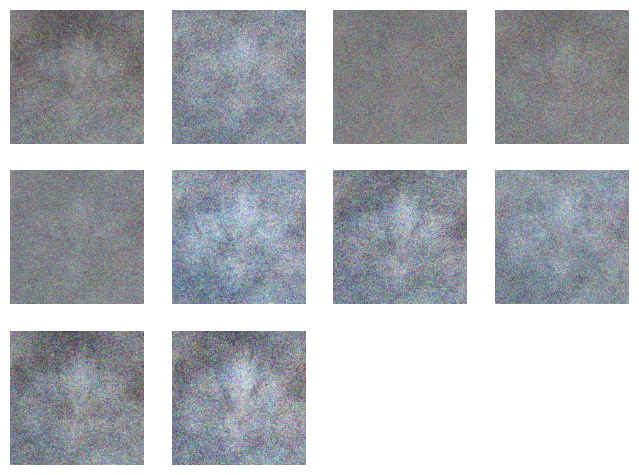

Epoch [1/20], Step [0/467], D Loss: 1.2534291744232178, G Loss: 0.6195788979530334
Epoch [1/20], Step [100/467], D Loss: 1.191894769668579, G Loss: 0.652928352355957
Epoch [1/20], Step [200/467], D Loss: 1.1508276462554932, G Loss: 0.678613543510437
Epoch [1/20], Step [300/467], D Loss: 1.193405032157898, G Loss: 0.670544445514679
Epoch [1/20], Step [400/467], D Loss: 1.2254457473754883, G Loss: 0.6746029853820801


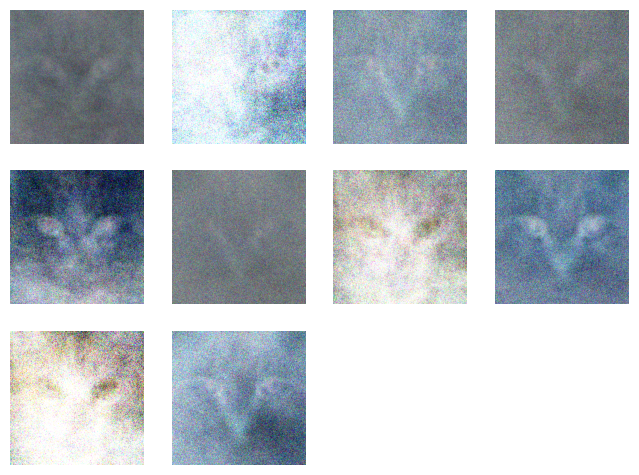

Epoch [2/20], Step [0/467], D Loss: 1.2319326400756836, G Loss: 0.6636630296707153
Epoch [2/20], Step [100/467], D Loss: 1.2392438650131226, G Loss: 0.6643382906913757
Epoch [2/20], Step [200/467], D Loss: 1.2356791496276855, G Loss: 0.6759499311447144
Epoch [2/20], Step [300/467], D Loss: 1.2370386123657227, G Loss: 0.6846997737884521
Epoch [2/20], Step [400/467], D Loss: 1.2671449184417725, G Loss: 0.668430745601654


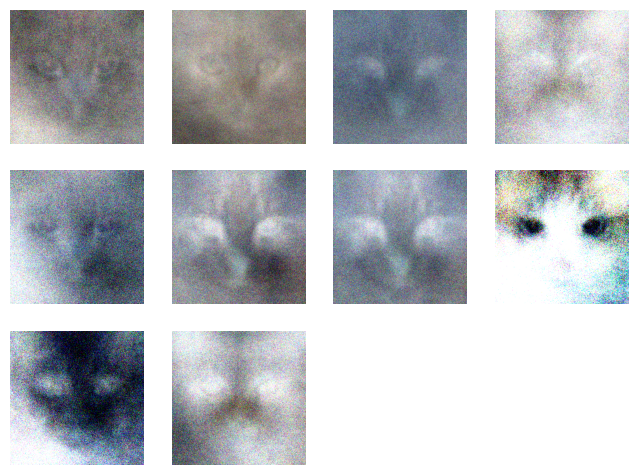

Epoch [3/20], Step [0/467], D Loss: 1.2594636678695679, G Loss: 0.6765255928039551
Epoch [3/20], Step [100/467], D Loss: 1.260155200958252, G Loss: 0.6727765798568726
Epoch [3/20], Step [200/467], D Loss: 1.3117964267730713, G Loss: 0.6708053350448608
Epoch [3/20], Step [300/467], D Loss: 1.2636373043060303, G Loss: 0.6751526594161987
Epoch [3/20], Step [400/467], D Loss: 1.289668321609497, G Loss: 0.6702567338943481


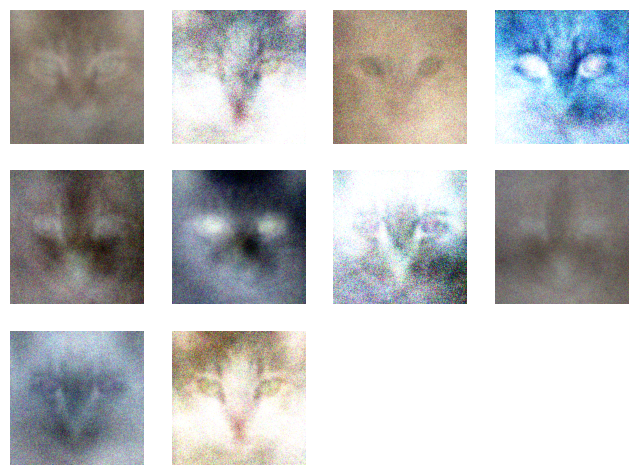

Epoch [4/20], Step [0/467], D Loss: 1.2843610048294067, G Loss: 0.6759845018386841
Epoch [4/20], Step [100/467], D Loss: 1.30584716796875, G Loss: 0.6712627410888672
Epoch [4/20], Step [200/467], D Loss: 1.2855782508850098, G Loss: 0.6645928621292114
Epoch [4/20], Step [300/467], D Loss: 1.29874587059021, G Loss: 0.6691241264343262
Epoch [4/20], Step [400/467], D Loss: 1.3044037818908691, G Loss: 0.6672228574752808


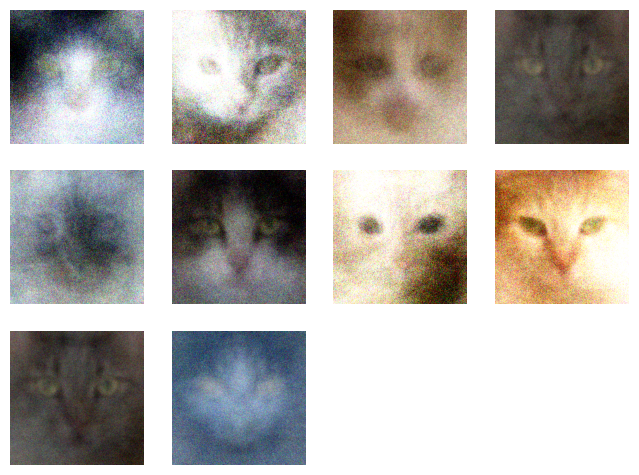

Epoch [5/20], Step [0/467], D Loss: 1.3406896591186523, G Loss: 0.668686032295227
Epoch [5/20], Step [100/467], D Loss: 1.3412604331970215, G Loss: 0.659639298915863
Epoch [5/20], Step [200/467], D Loss: 1.3352386951446533, G Loss: 0.6593402624130249
Epoch [5/20], Step [300/467], D Loss: 1.3413820266723633, G Loss: 0.6669269800186157
Epoch [5/20], Step [400/467], D Loss: 1.326448678970337, G Loss: 0.6705823540687561


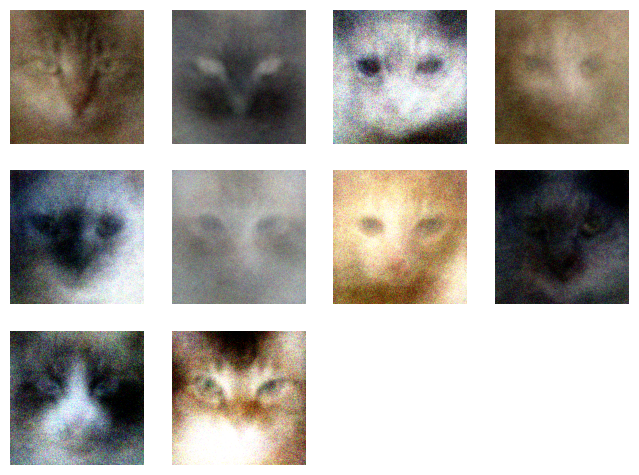

Epoch [6/20], Step [0/467], D Loss: 1.341432809829712, G Loss: 0.6592714786529541
Epoch [6/20], Step [100/467], D Loss: 1.3445062637329102, G Loss: 0.6583319306373596
Epoch [6/20], Step [200/467], D Loss: 1.3512096405029297, G Loss: 0.6501564383506775
Epoch [6/20], Step [300/467], D Loss: 1.3309212923049927, G Loss: 0.6593037843704224
Epoch [6/20], Step [400/467], D Loss: 1.3785712718963623, G Loss: 0.6602765321731567


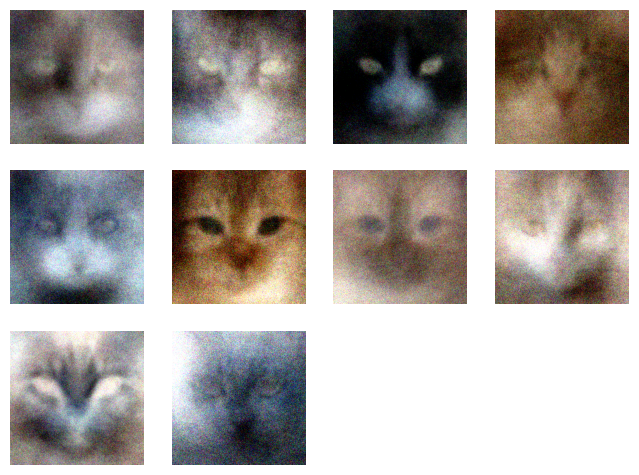

Epoch [7/20], Step [0/467], D Loss: 1.3474223613739014, G Loss: 0.6626282930374146
Epoch [7/20], Step [100/467], D Loss: 1.383233904838562, G Loss: 0.6675509214401245
Epoch [7/20], Step [200/467], D Loss: 1.3798569440841675, G Loss: 0.6473568677902222
Epoch [7/20], Step [300/467], D Loss: 1.3618732690811157, G Loss: 0.670356273651123
Epoch [7/20], Step [400/467], D Loss: 1.357055425643921, G Loss: 0.6743981838226318


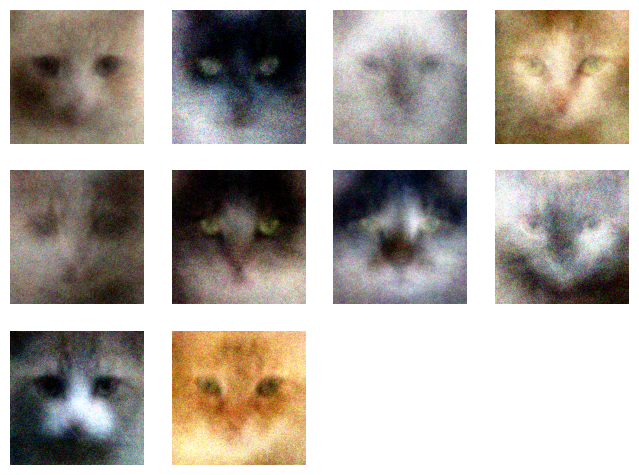

Epoch [8/20], Step [0/467], D Loss: 1.3405163288116455, G Loss: 0.6743156313896179
Epoch [8/20], Step [100/467], D Loss: 1.381908893585205, G Loss: 0.6776748895645142
Epoch [8/20], Step [200/467], D Loss: 1.354154348373413, G Loss: 0.6702562570571899
Epoch [8/20], Step [300/467], D Loss: 1.3655657768249512, G Loss: 0.6700624227523804
Epoch [8/20], Step [400/467], D Loss: 1.3652827739715576, G Loss: 0.6736992597579956


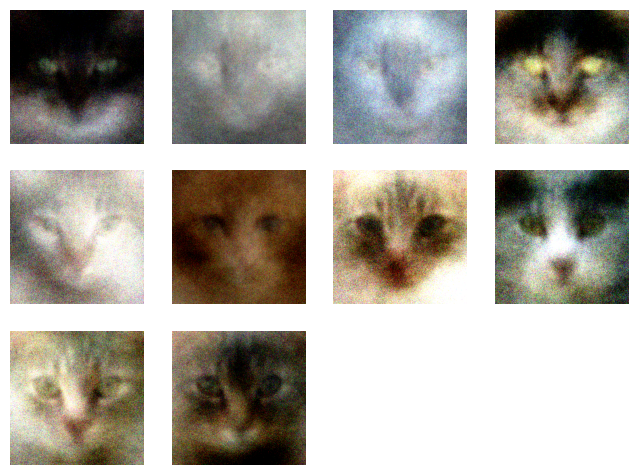

Epoch [9/20], Step [0/467], D Loss: 1.3696250915527344, G Loss: 0.6586991548538208
Epoch [9/20], Step [100/467], D Loss: 1.3736646175384521, G Loss: 0.6729812026023865
Epoch [9/20], Step [200/467], D Loss: 1.3608791828155518, G Loss: 0.6665382385253906
Epoch [9/20], Step [300/467], D Loss: 1.365989089012146, G Loss: 0.6712033152580261
Epoch [9/20], Step [400/467], D Loss: 1.3738744258880615, G Loss: 0.6637409329414368


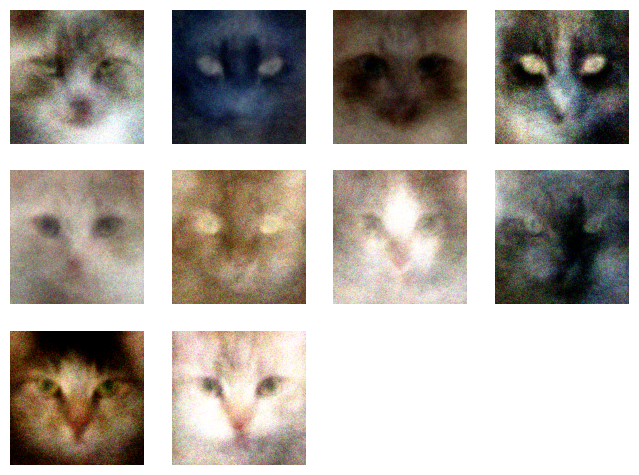

Epoch [10/20], Step [0/467], D Loss: 1.3739216327667236, G Loss: 0.678827166557312
Epoch [10/20], Step [100/467], D Loss: 1.3599807024002075, G Loss: 0.6678996682167053
Epoch [10/20], Step [200/467], D Loss: 1.3873708248138428, G Loss: 0.6727760434150696
Epoch [10/20], Step [300/467], D Loss: 1.3708244562149048, G Loss: 0.6807683706283569
Epoch [10/20], Step [400/467], D Loss: 1.372376799583435, G Loss: 0.6797574162483215


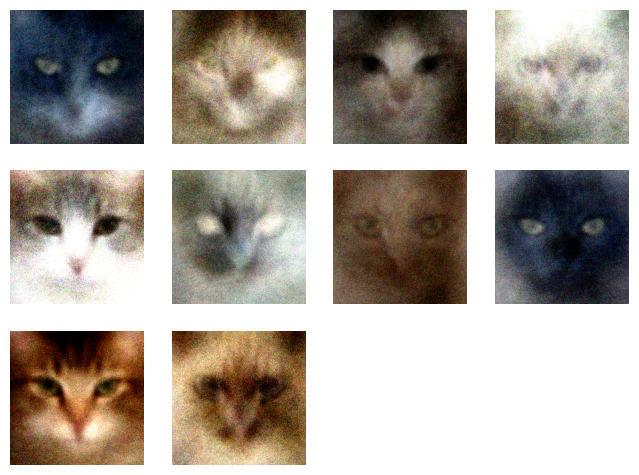

Epoch [11/20], Step [0/467], D Loss: 1.3806265592575073, G Loss: 0.6630762815475464
Epoch [11/20], Step [100/467], D Loss: 1.3802368640899658, G Loss: 0.6633563041687012
Epoch [11/20], Step [200/467], D Loss: 1.3650460243225098, G Loss: 0.6585808992385864
Epoch [11/20], Step [300/467], D Loss: 1.3561855554580688, G Loss: 0.6664106249809265
Epoch [11/20], Step [400/467], D Loss: 1.3737157583236694, G Loss: 0.666852593421936


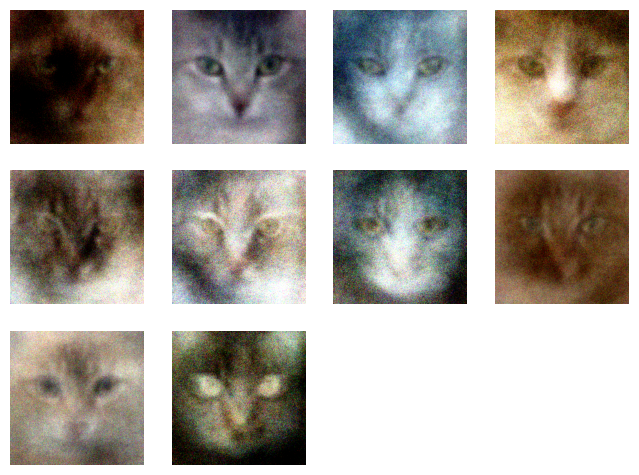

Epoch [12/20], Step [0/467], D Loss: 1.3736666440963745, G Loss: 0.6790819764137268
Epoch [12/20], Step [100/467], D Loss: 1.3593058586120605, G Loss: 0.6733033061027527
Epoch [12/20], Step [200/467], D Loss: 1.3889191150665283, G Loss: 0.6787279844284058
Epoch [12/20], Step [300/467], D Loss: 1.364001989364624, G Loss: 0.6797073483467102
Epoch [12/20], Step [400/467], D Loss: 1.358276128768921, G Loss: 0.6830623149871826


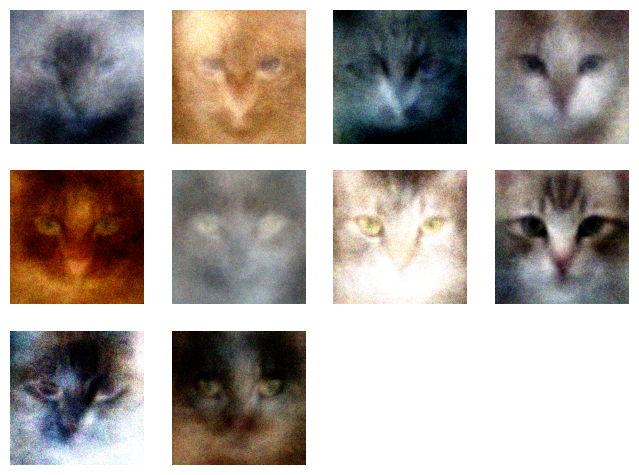

Epoch [13/20], Step [0/467], D Loss: 1.3382561206817627, G Loss: 0.6683439612388611
Epoch [13/20], Step [100/467], D Loss: 1.3799669742584229, G Loss: 0.6795271039009094
Epoch [13/20], Step [200/467], D Loss: 1.3791794776916504, G Loss: 0.6681602001190186
Epoch [13/20], Step [300/467], D Loss: 1.384417176246643, G Loss: 0.6788783073425293
Epoch [13/20], Step [400/467], D Loss: 1.3884696960449219, G Loss: 0.675294041633606


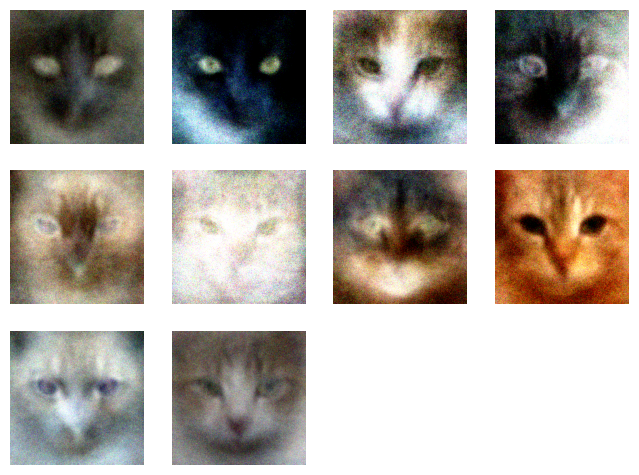

Epoch [14/20], Step [0/467], D Loss: 1.3829078674316406, G Loss: 0.6849777698516846
Epoch [14/20], Step [100/467], D Loss: 1.3768879175186157, G Loss: 0.6815835237503052
Epoch [14/20], Step [200/467], D Loss: 1.381382942199707, G Loss: 0.6856451034545898
Epoch [14/20], Step [300/467], D Loss: 1.3543589115142822, G Loss: 0.6693439483642578
Epoch [14/20], Step [400/467], D Loss: 1.3860994577407837, G Loss: 0.6748172044754028


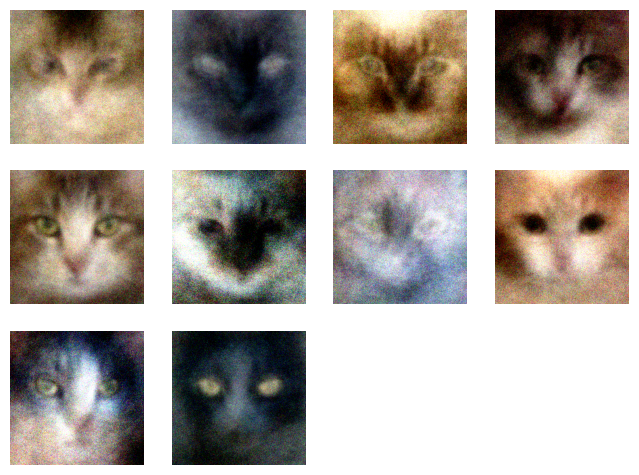

Epoch [15/20], Step [0/467], D Loss: 1.382070541381836, G Loss: 0.665062665939331
Epoch [15/20], Step [100/467], D Loss: 1.362229585647583, G Loss: 0.6856630444526672
Epoch [15/20], Step [200/467], D Loss: 1.3732595443725586, G Loss: 0.6810365915298462
Epoch [15/20], Step [300/467], D Loss: 1.3666965961456299, G Loss: 0.6852772831916809
Epoch [15/20], Step [400/467], D Loss: 1.3596901893615723, G Loss: 0.6824662089347839


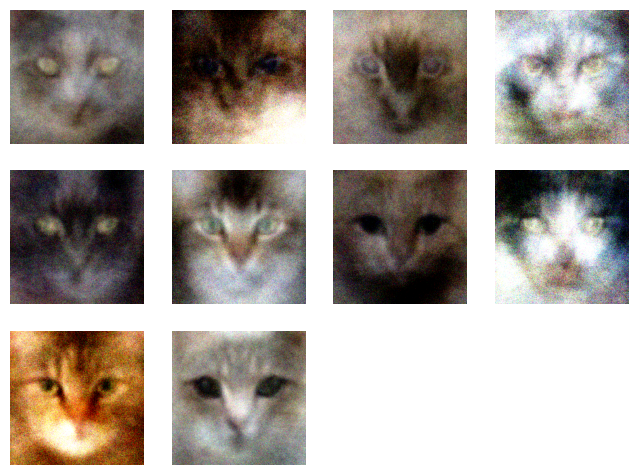

Epoch [16/20], Step [0/467], D Loss: 1.396285057067871, G Loss: 0.6729799509048462
Epoch [16/20], Step [100/467], D Loss: 1.3732900619506836, G Loss: 0.6751673221588135
Epoch [16/20], Step [200/467], D Loss: 1.3798561096191406, G Loss: 0.6687949895858765
Epoch [16/20], Step [300/467], D Loss: 1.3938039541244507, G Loss: 0.6739952564239502
Epoch [16/20], Step [400/467], D Loss: 1.3784925937652588, G Loss: 0.667278528213501


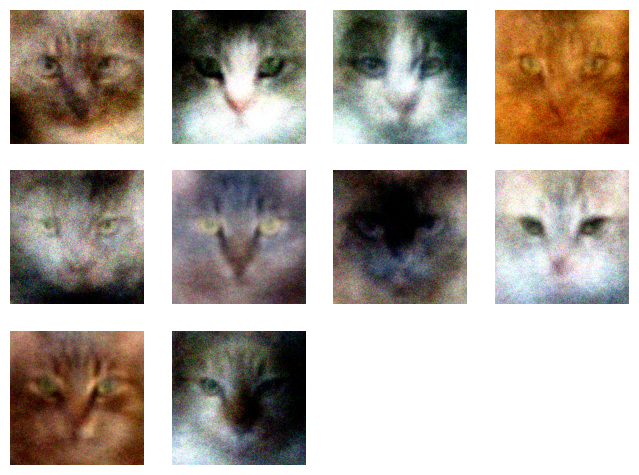

Epoch [17/20], Step [0/467], D Loss: 1.3713977336883545, G Loss: 0.6726139783859253
Epoch [17/20], Step [100/467], D Loss: 1.3642264604568481, G Loss: 0.6827417016029358
Epoch [17/20], Step [200/467], D Loss: 1.3787931203842163, G Loss: 0.6823115944862366
Epoch [17/20], Step [300/467], D Loss: 1.3692283630371094, G Loss: 0.675682544708252
Epoch [17/20], Step [400/467], D Loss: 1.3666914701461792, G Loss: 0.6786142587661743


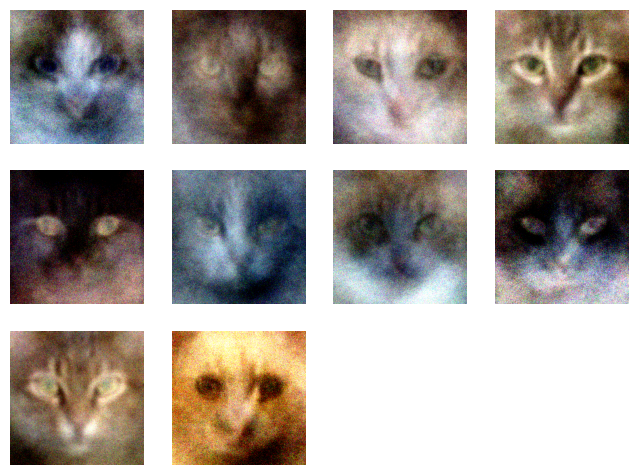

Epoch [18/20], Step [0/467], D Loss: 1.375003457069397, G Loss: 0.6764228940010071
Epoch [18/20], Step [100/467], D Loss: 1.3763267993927002, G Loss: 0.6797850728034973
Epoch [18/20], Step [200/467], D Loss: 1.3749678134918213, G Loss: 0.6762278079986572
Epoch [18/20], Step [300/467], D Loss: 1.3894234895706177, G Loss: 0.6813071370124817
Epoch [18/20], Step [400/467], D Loss: 1.3746778964996338, G Loss: 0.6823597550392151


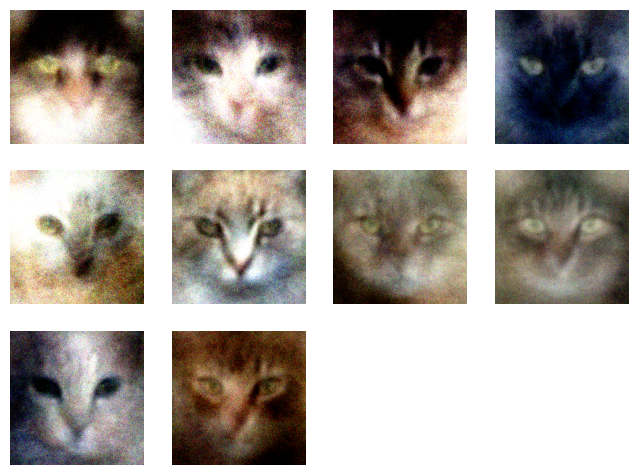

Epoch [19/20], Step [0/467], D Loss: 1.3711609840393066, G Loss: 0.6665505170822144
Epoch [19/20], Step [100/467], D Loss: 1.3813261985778809, G Loss: 0.6870349645614624
Epoch [19/20], Step [200/467], D Loss: 1.3843815326690674, G Loss: 0.6854138374328613
Epoch [19/20], Step [300/467], D Loss: 1.3829929828643799, G Loss: 0.6749758124351501
Epoch [19/20], Step [400/467], D Loss: 1.3759452104568481, G Loss: 0.6841771602630615


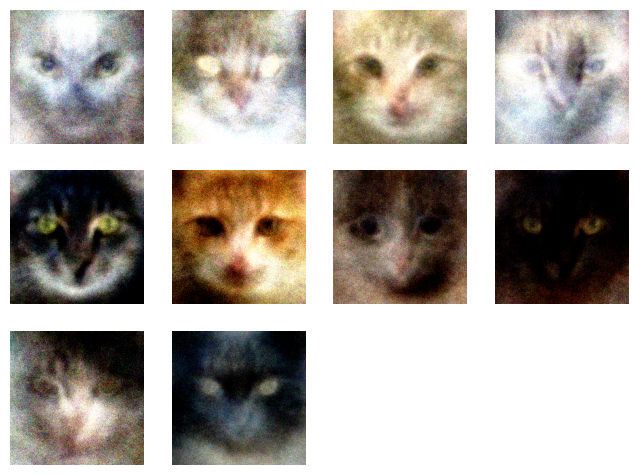

In [23]:
G = Generator().to(device)
D = Discriminator().to(device)

D_solver = get_optimizer(D)
G_solver = get_optimizer(G)
# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs)